    Studying the hospital readmissions case for diabetes patiets, based on data collected from inpatient admissions to 150 hospitals in USA. The readmission criteria was set to be within 30 days of first admission, the data collected included various lab tests, medication and stats of each patient. The purpose of this project is to explore the dataset and build a prediction model.

## Data Loading and Cleaning

In [1189]:
import pandas as pd
import numpy as np

In [1227]:
data=pd.read_csv('diabetic_data.csv')
data

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [1193]:
ids_map=pd.read_csv('IDS_mapping.csv')

In [1195]:
ids_map[(ids_map.admission_type_id=='discharge_disposition_id') | (ids_map.admission_type_id=='admission_source_id')].index.values

array([ 9, 41], dtype=int64)

In [1197]:
adm_map=pd.DataFrame(ids_map.iloc[0:8].reset_index())
disc_map=pd.DataFrame(ids_map.iloc[10:40].reset_index())
adm_src_map=pd.DataFrame(ids_map.iloc[42:].reset_index())

In [1207]:
adm_map

,index,admission_type_id,description
0,0,1,Emergency
1,1,2,Urgent
2,2,3,Elective
3,3,4,Newborn
4,4,5,Not Available
5,5,6,NaN
6,6,7,Trauma Center
7,7,8,Not Mapped


In [1199]:
disc_map.rename(columns={'admission_type_id':'discharge_disposition_id'},inplace=True)
adm_src_map.rename(columns={'admission_type_id':'admission_source_id'},inplace=True)

In [1229]:
adm_map['admission_type_id']=pd.to_numeric(adm_map['admission_type_id'],errors='coerce')
disc_map['discharge_disposition_id']=pd.to_numeric(disc_map['discharge_disposition_id'],errors='coerce')
adm_src_map['admission_source_id']=pd.to_numeric(adm_src_map['admission_source_id'],errors='coerce')

data['admission_type_descr']=data['admission_type_id'].map(dict(adm_map[['admission_type_id','description']].values))
data['discharge_disposition_descr']=data['discharge_disposition_id'].map(dict(disc_map[['discharge_disposition_id','description']].values))
data['admission_source_descr']=data['admission_source_id'].map(dict(adm_src_map[['admission_source_id','description']].values))

In [1239]:
data.shape

(101766, 53)

## Exploratory Data Analysis (EDA)

In [10]:
data.groupby('gender')['readmitted'].count()

gender
Female             54708
Male               47055
Unknown/Invalid        3
Name: readmitted, dtype: int64

In [11]:
data.groupby('race')['readmitted'].count()

race
?                   2273
AfricanAmerican    19210
Asian                641
Caucasian          76099
Hispanic            2037
Other               1506
Name: readmitted, dtype: int64

In [12]:
data.groupby('race')['number_diagnoses'].mean()

race
?                  6.695557
AfricanAmerican    7.108381
Asian              7.049922
Caucasian          7.544790
Hispanic           6.924399
Other              7.186587
Name: number_diagnoses, dtype: float64

In [13]:
data.groupby('gender')['number_diagnoses'].mean()

gender
Female             7.428639
Male               7.415684
Unknown/Invalid    6.000000
Name: number_diagnoses, dtype: float64

In [14]:
data.groupby('age')['number_diagnoses'].mean()

age
[0-10)      2.695652
[10-20)     3.947902
[20-30)     5.866626
[30-40)     6.452980
[40-50)     6.948787
[50-60)     7.238584
[60-70)     7.506427
[70-80)     7.651795
[80-90)     7.888702
[90-100)    7.884712
Name: number_diagnoses, dtype: float64

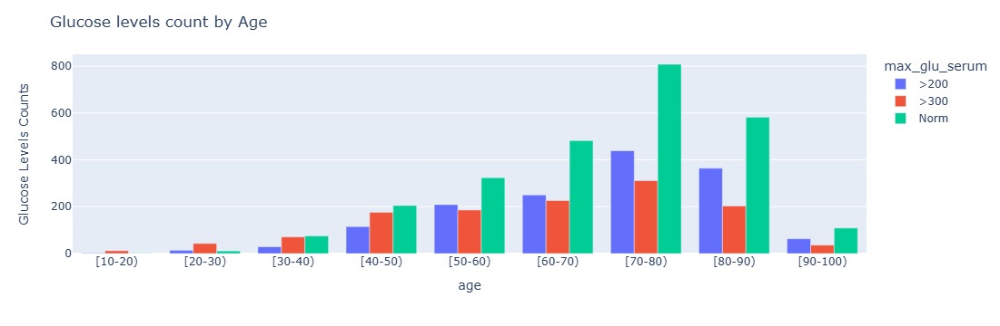

In [15]:
import plotly.express as px
glu_dist=data.groupby(['age','max_glu_serum'])['readmitted'].count().reset_index()

fig=px.bar(glu_dist,x='age',y='readmitted',color='max_glu_serum',barmode='group')
fig.update_yaxes(title_text='Glucose Levels Counts')
fig.update_layout(title_text='Glucose levels count by Age')
fig.show()

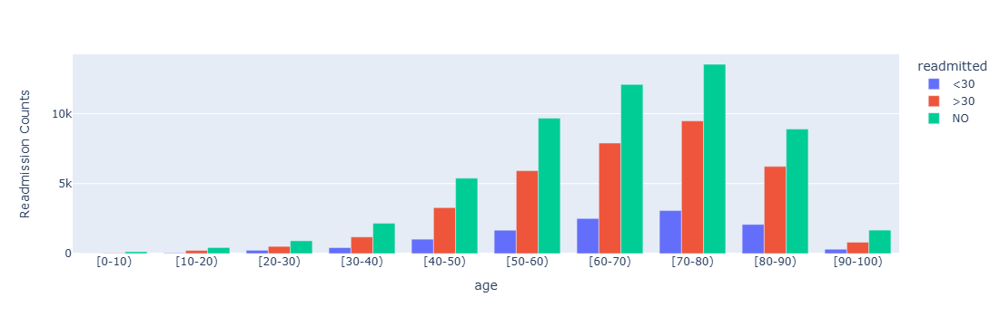

In [16]:
readm_count=data.groupby(['age','readmitted'])['gender'].count().reset_index()

fig=px.bar(readm_count,x='age',y='gender',color='readmitted',barmode='group')
fig.update_yaxes(title_text='Readmission Counts')
fig.show()

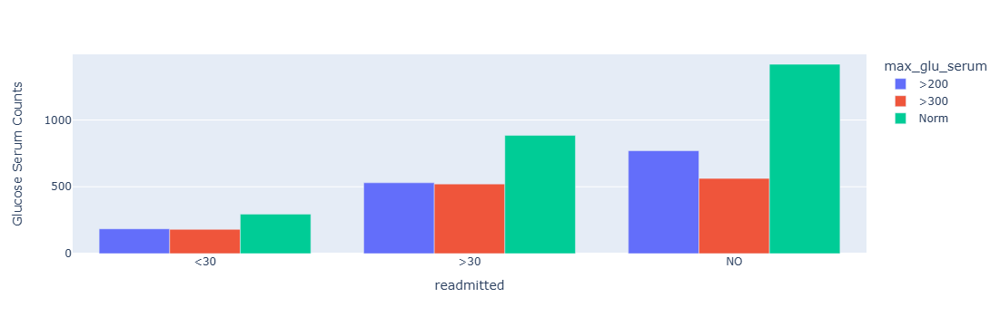

In [17]:
glu_readm=data.groupby(['max_glu_serum','readmitted'])['age'].count().reset_index()
fig=px.bar(glu_readm,x='readmitted',y='age',color='max_glu_serum',barmode='group')
fig.update_yaxes(title_text='Glucose Serum Counts')
fig.show()

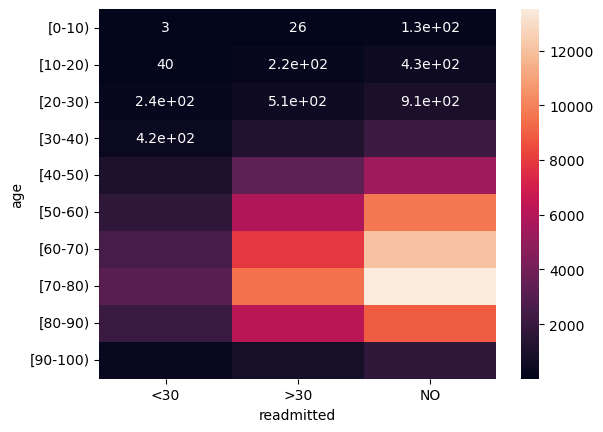

In [92]:
age_heat=readm_count.pivot_table(values='gender',index='age',columns='readmitted')
sns.heatmap(age_heat,annot=True)
plt.show()

In [94]:
fig=px.box(data,x='

0          No
1         Yes
2         Yes
3         Yes
4         Yes
         ... 
101761    Yes
101762    Yes
101763    Yes
101764    Yes
101765     No
Name: diabetesMed, Length: 101766, dtype: object

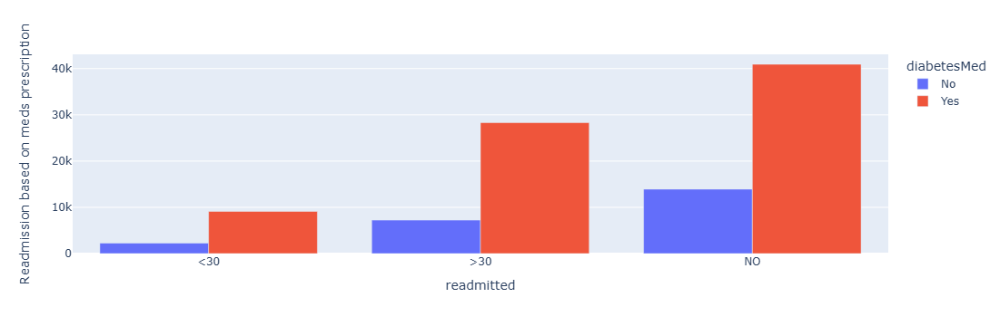

In [110]:
meds_readm=data.groupby(['diabetesMed','readmitted'])['gender'].count().reset_index()

fig=px.bar(meds_readm,x='readmitted',y='gender',color='diabetesMed',barmode='group')
fig.update_yaxes(title_text='Readmission based on meds prescription')
fig.show()

In [36]:
icd9_chapters = {
    "1": {"description": "Infectious and Parasitic Diseases", "range": ("001", "139")},
    "2": {"description": "Neoplasms", "range": ("140", "239")},
    "3": {"description": "Endocrine, Nutritional and Metabolic Diseases, and Immunity Disorders", "range": ("240", "279")},
    "4": {"description": "Diseases of the Blood and Blood-Forming Organs", "range": ("280", "289")},
    "5": {"description": "Mental Disorders", "range": ("290", "319")},
    "6": {"description": "Diseases of the Nervous System and Sense Organs", "range": ("320", "389")},
    "7": {"description": "Diseases of the Circulatory System", "range": ("390", "459")},
    "8": {"description": "Diseases of the Respiratory System", "range": ("460", "519")},
    "9": {"description": "Diseases of the Digestive System", "range": ("520", "579")},
    "10": {"description": "Diseases of the Genitourinary System", "range": ("580", "629")},
    "11": {"description": "Complications of Pregnancy, Childbirth, and the Puerperium", "range": ("630", "679")},
    "12": {"description": "Diseases of the Skin and Subcutaneous Tissue", "range": ("680", "709")},
    "13": {"description": "Diseases of the Musculoskeletal System and Connective Tissue", "range": ("710", "739")},
    "14": {"description": "Congenital Anomalies", "range": ("740", "759")},
    "15": {"description": "Certain Conditions Originating in the Perinatal Period", "range": ("760", "779")},
    "16": {"description": "Symptoms, Signs, and Ill-Defined Conditions", "range": ("780", "799")},
    "17": {"description": "Injury and Poisoning", "range": ("800", "999")},
    "18": {"description": "Supplementary Classification of Factors Influencing Health Status and Contact with Health Services (V Codes)", "range": ("V01", "V91")},
    "19": {"description": "Supplementary Classification of External Causes of Injury and Poisoning (E Codes)", "range": ("E000", "E999")},
}

In [38]:
def icd9chapter(x):
    code=x
    for chapter,info in icd9_chapters.items():
        start,end=info["range"]
        if start <= code <= end:
            return([chapter,info['description']])
    return(['None','No Description'])


In [40]:
for diag in ['diag_1','diag_2','diag_3']:
    data[diag+'_chapter']=data[diag].apply(lambda x: icd9chapter(x)[0])
    data[diag+'_descr']=data[diag].apply(lambda x: icd9chapter(x)[1])

In [44]:
data.diag_1_descr

0         Endocrine, Nutritional and Metabolic Diseases,...
1         Endocrine, Nutritional and Metabolic Diseases,...
2         Complications of Pregnancy, Childbirth, and th...
3                                            No Description
4                                                 Neoplasms
                                ...                        
101761    Endocrine, Nutritional and Metabolic Diseases,...
101762                     Diseases of the Digestive System
101763      Diseases of the Nervous System and Sense Organs
101764                                 Injury and Poisoning
101765                     Diseases of the Digestive System
Name: diag_1_descr, Length: 101766, dtype: object

In [48]:
data.change.unique

<bound method Series.unique of 0         No
1         Ch
2         No
3         Ch
4         Ch
          ..
101761    Ch
101762    No
101763    Ch
101764    Ch
101765    No
Name: change, Length: 101766, dtype: object>

In [140]:
top_2_diag=data[data.readmitted != 'NO']['diag_2_descr'].value_counts().nlargest(20).reset_index()['diag_2_descr'].tolist()
total=data[data.diag_1_descr.isin(top_2_diag)]
info=total[total.change =='Ch']
diag=info[info.A1Cresult.isnull()]['diag_2_descr'].value_counts().nlargest(5).reset_index()#['diag_2_descr'].values
num=info[info.patient_nbr.isin(info.patient_nbr.unique())].A1Cresult.isnull().sum()
per=(num/total[total.patient_nbr.isin(info.patient_nbr.unique())].size)*100

print(f'The number of people readmitted wih no HbA1C tests and meds changed: {num}\n')
print(f'The most common secondary diagnosis are:\n\n {diag}\n')
print(f'The percentage of people readmitted wih no HbA1C tests and meds changed: {per:0.3f}%')

The number of people readmitted wih no HbA1C tests and meds changed: 37521

The most common secondary diagnosis are:

                                         diag_2_descr  count
0                 Diseases of the Circulatory System  11332
1  Endocrine, Nutritional and Metabolic Diseases,...   7876
2                 Diseases of the Respiratory System   4126
3               Diseases of the Genitourinary System   2952
4        Symptoms, Signs, and Ill-Defined Conditions   1647

The percentage of people readmitted wih no HbA1C tests and meds changed: 1.114%


In [184]:
readm=data[data.readmitted!='NO']
readm_nullA1c=readm[readm.A1Cresult.isnull()]

readm_nullA1c[['diag_2_descr','admission_type_descr']].value_counts().nlargest(10)

diag_2_descr                                                           admission_type_descr
Diseases of the Circulatory System                                     Emergency               6844
Endocrine, Nutritional and Metabolic Diseases, and Immunity Disorders  Emergency               4115
Diseases of the Respiratory System                                     Emergency               2441
Diseases of the Circulatory System                                     Urgent                  2326
                                                                       Elective                2286
Diseases of the Genitourinary System                                   Emergency               2010
Endocrine, Nutritional and Metabolic Diseases, and Immunity Disorders  Urgent                  1318
                                                                       Elective                1214
Symptoms, Signs, and Ill-Defined Conditions                            Emergency                954
Diseases

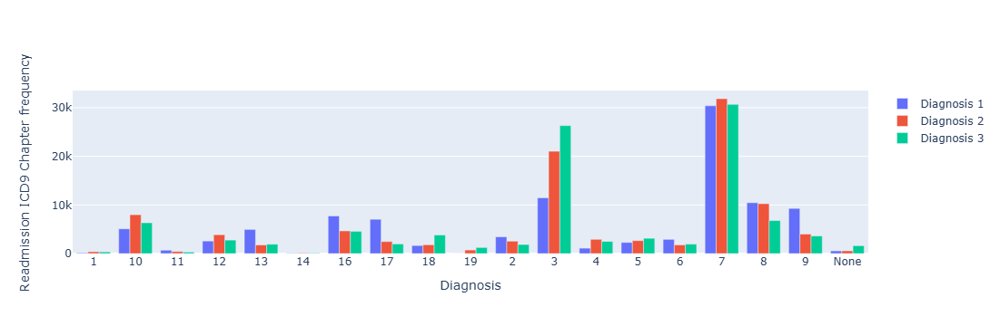

In [267]:
diag1_chapter=data.groupby(['diag_1_chapter'])['readmitted'].count().reset_index()
diag2_chapter=data.groupby(['diag_2_chapter'])['readmitted'].count().reset_index()
diag3_chapter=data.groupby(['diag_3_chapter'])['readmitted'].count().reset_index()

from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig=make_subplots()

fig.add_trace(go.Bar(x=diag1_chapter.diag_1_chapter,y=diag1_chapter.readmitted,name='Diagnosis 1'))
fig.add_trace(go.Bar(x=diag2_chapter.diag_2_chapter,y=diag2_chapter.readmitted,name='Diagnosis 2'))
fig.add_trace(go.Bar(x=diag3_chapter.diag_3_chapter,y=diag3_chapter.readmitted,name='Diagnosis 3'))


fig.update_yaxes(title_text='Readmission ICD9 Chapter frequency')
fig.update_xaxes(title_text='Diagnosis')
fig.update_layout(title_text='Diagnosis most commonly usedd (ICD9 Chapters)')
fig.show()

In [278]:
icd9_chapters['7']

{'description': 'Diseases of the Circulatory System', 'range': ('390', '459')}

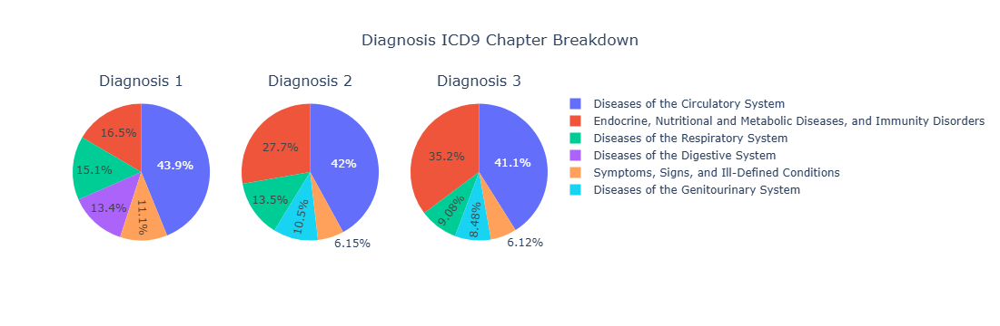

In [564]:
diag1_chapter=data.groupby(['diag_1_descr'])['readmitted'].count().nlargest().reset_index()
diag2_chapter=data.groupby(['diag_2_descr'])['readmitted'].count().nlargest().reset_index()
diag3_chapter=data.groupby(['diag_3_descr'])['readmitted'].count().nlargest().reset_index()


fig=make_subplots(rows=1,cols=3,specs=[[{"type": "domain"}, {"type": "domain"},{"type": "domain"}]],
                 subplot_titles=("Diagnosis 1", "Diagnosis 2", "Diagnosis 3"))

fig.add_trace(go.Pie(values=diag1_chapter.readmitted,labels=diag1_chapter.diag_1_descr),row=1,col=1)
fig.add_trace(go.Pie(values=diag2_chapter.readmitted,labels=diag2_chapter.diag_2_descr),row=1,col=2)
fig.add_trace(go.Pie(values=diag3_chapter.readmitted,labels=diag3_chapter.diag_3_descr),row=1,col=3)

fig.update_layout(title_text='Diagnosis ICD9 Chapter Breakdown',title_x=0.5)
fig.show()

## Hb1AC Testing and Redmittance

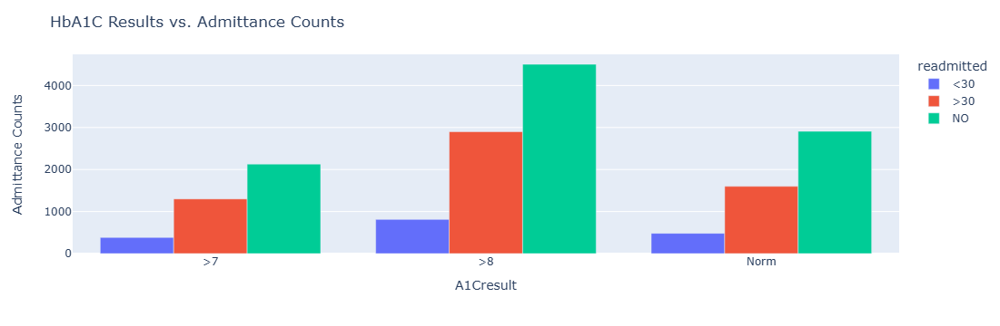

In [740]:
A1c_readm=data.groupby(['A1Cresult','readmitted'])['gender'].count().reset_index()

fig=px.bar(A1c_readm,x='A1Cresult',y='gender',color='readmitted',barmode='group')
fig.update_yaxes(title_text='Admittance Counts')
fig.update_layout(title_text='HbA1C Results vs. Admittance Counts')
fig.show()

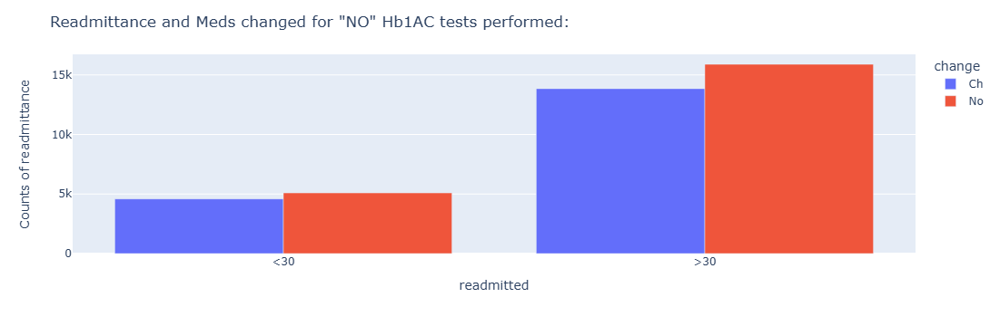

In [742]:
hb1c_meds=data[(data.readmitted!='NO') &(data.A1Cresult.isnull())].groupby(['readmitted','change'])['age'].count().reset_index()
fig=px.bar(hb1c_meds,x='readmitted',y='age',color='change',barmode='group')
fig.update_yaxes(title_text='Counts of readmittance')
fig.update_layout(title_text='Readmittance and Meds changed for "NO" Hb1AC tests performed:')
fig.show()

In [611]:
prop=(data[(data.A1Cresult.isnull()) & (data.change=='Ch')].size)/data.size*100
null=(data[(data.readmitted=='NO') & (data.A1Cresult.isnull()) & (data.change=='Ch')].size)/data[data.readmitted =='NO'].size*100
A1cnull=readm[readm.A1Cresult.isnull()]
val=(A1cnull[A1cnull.change=='Ch'].size)/A1cnull.size*100
print(f'Percentage of people who had no A1C tests done AND had a change in medication: {prop:0.2f}% \n')
print(f'Percentage of NON-READMITTED people who had no A1C tests done AND had a change in medication: {null:0.2f}% \n')
print(f'Percentage of READMITTED people who had no A1C tests done AND had a change in medication: {val:0.2f}%')

Percentage of people who had no A1C tests done AND had a change in medication: 36.87%

Percentage of NON-READMITTED people who had no A1C tests done AND had a change in medication: 34.78%

Percentage of READMITTED people who had no A1C tests done AND had a change in medication: 46.77%


In [268]:
A1cnull[['num_procedures','num_lab_procedures','num_medications']].mean()

num_procedures         1.256836
num_lab_procedures    41.782884
num_medications       16.303911
dtype: float64

In [270]:
A1c=readm[readm.A1Cresult.notnull()]
val=(A1c[A1c.change=='Ch'].size)/A1c.size*100
print(f'Percentage of readmitted people who had A1C tests done AND had a change in medication: {val:0.2f}%\n')
A1c[['num_procedures','num_lab_procedures','num_medications']].mean()

Percentage of readmitted people who had A1C tests done AND had a change in medication: 58.73%



num_procedures         1.258962
num_lab_procedures    55.258828
num_medications       17.113697
dtype: float64

Looking at the results above, we can see that in cases where there was no HbA1C testing done the change in medication rate is 36.87%. In readmission cases 46.77%, in non-readmitted cases 34.78%. However, from those who did receive a test 58.73% saw an increase in their medication. This can be an indication to study the affects of medication changes based on inaffective lab testings on readmission rates.

In [1284]:
import math
data['A1C_test']=data.A1Cresult.apply(lambda x: 'Yes' if x not in ['>7', '>8', 'Norm'] else 'No')
data['Admittance']=data.readmitted.apply(lambda x: 'No' if x =='NO' else 'Yes')

In [366]:
from scipy.stats import chi2_contingency

contingency_table=pd.crosstab(data['A1C_test'],data['Admittance'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square: {chi2}, P-value: {p}")

Chi-Square: 38.2014114809573, P-value: 6.380624968152514e-10


Looking at the Ch-Squared test with a P-value of <0.05, we can safely assume that there is a significant relationship between administering the test and readmission rates.

In [519]:
contingency_table1=pd.crosstab(data.Admittance,data.change)
chi22,p2,dof,expected=chi2_contingency(contingency_table1)
print(f"Chi-squared value: {chi22} and P-value:{p2}")

n = contingency_table1.values.sum()
r, k = contingency_table1.shape
cramers_v = np.sqrt(chi22/ (n * min(k-1, r-1)))
print(f"Cramér's V: {cramers_v}")

Chi-squared value: 215.22281890604168 and P-value:9.964594376477834e-49
Cramér's V: 0.04598781815360663


In [ ]:
contingency_table2=pd.crosstab(data.Admittance,da

In [730]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.linear_model import LogisticRegression

le=LabelEncoder()
le.fit(data.Admittance)
X=OneHotEncoder().fit_transform(np.array(data.change).reshape(-1,1))
y=le.transform(data.Admittance)

classes=le.classes_
model=LogisticRegression()
model.fit(X,y)
coef=np.exp(model.coef_)
print(classes)
print(f"LogReg exp coef: b_1 = {model.coef_[0][0]} and intercept: b_0= {model.intercept_[0]}")

['No' 'Yes']
LogReg exp coef: b_1 = 0.042559445303641044 and intercept: b_0= -0.10005746799189681


In [734]:
p1=1/(1+(1/np.exp(model.coef_[0][0]+model.intercept_[0])))
p2=1/(1+(1/np.exp(model.intercept_[0])))
odds_r=np.exp(model.coef_[0][0])
print(f'Probability that there IS readmittiance given there is a drug change: {p1*100:0.2f}%\n')
print(f'Probability that there is NO readmittiance given there is a drug change: {p2*100:0.2f}%\n')
print(f'Odds that a change in drugs will cause readmittance: {odds_r:0.2f}x\n')

Probability that there IS readmittiance given there is a drug change: 48.56%

Probability that there is NO readmittiance given there is a drug change: 47.50%

Odds that a change in drugs will cause readmittance: 1.04x



## Racial Analysis

In [447]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import dash
from dash import Dash,html,dcc,Input,Output

#pi_info=data[['race','discharge_disposition_descr']].value_counts().reset_index()

race_app=Dash()

race_app.layout=html.Div([
    html.Div([
        dcc.Dropdown(data.race.unique().tolist(),placeholder='Select patient race',id='select_race'),
        dcc.Graph(id='race_discharge')
    ])
])

@race_app.callback(
    Output('race_discharge','figure'),
    Input('select_race','value')
)

def update_race(select_race):
    info=data[(data.race==select_race) & (data.readmitted !='NO')]
    info=info['discharge_disposition_descr'].value_counts().nlargest(5).reset_index()
    fig=px.pie(info,values='count',names='discharge_disposition_descr')
    fig.update_layout(title_text=f'Readmitted Discharge Reasons for {select_race}')
    return fig

race_app.run_server(jupyter_mode='inline',port=8052)





The above pie chart provides an interesting insight into healthcare equity, with a majority of patients being released to return back home. However, there are noticeable differences between the racial groups, with Caucasian Americans being more likely to be transferred to inpatient units. This can be for a multitude of reasons, from health coverage to hospital staff prejudice, further investigation needs to be completed to improve Quality of healthcare.

In [1043]:
quant=['num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient','time_in_hospital']

quant_race=data.groupby('race')[quant].mean().reset_index()
quant_race

,race,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,time_in_hospital
0,?,44.104707,1.302684,15.813462,0.194457,0.044435,0.305763,4.289485
1,AfricanAmerican,44.085060,1.234669,15.368922,0.239927,0.261010,0.701770,4.507860
2,Asian,41.212168,1.344774,13.291732,0.165367,0.093604,0.482059,3.995320
3,Caucasian,42.832941,1.369466,16.285733,0.412410,0.185679,0.634240,4.385721
4,Hispanic,42.793324,1.116838,14.030437,0.324497,0.228277,0.611193,4.059892
5,Other,43.436919,1.532537,15.185923,0.256308,0.241036,0.454183,4.273572


In [1057]:
race_quant=Dash()

race_quant.layout=html.Div([
        dcc.Dropdown(quant,placeholder='Select Numerical Data',id='select_quant'),
        dcc.Graph(id='race_box')
    ])


@race_quant.callback(
    Output('race_box','figure'),
    Input('select_quant','value')
)

def update_racebox(select_quant):
    q1=data[select_quant].quantile(0.25)
    q3=data[select_quant].quantile(0.75)
    iqr=q3-q1
    low=q1-(0.05*iqr)
    up=q3+(0.05*iqr)
    info=data[(low< data[select_quant]) | (data[select_quant] < up)]
    fig=px.box(info,x='race',y=select_quant,color='Admittance')
    title=' '.join(select_quant.split('_')).capitalize()
    fig.update_yaxes(title_text=f'{title} values')
    fig.update_layout(title_text=f'{title} Values for Racial Groups')
    return fig

race_quant.run_server(jupyter_mode='inline',port=8050)

In [894]:
race_pie=Dash()

race_pie.layout=html.Div([
    html.Div([
        dcc.Dropdown(data.race.unique().tolist(),placeholder='Select patient race',id='select_race'),
        dcc.Graph(id='race_pie')
    ])
])

@race_pie.callback(
    Output('race_pie','figure'),
    Input('select_race','value')
)

def update_race(select_race):
    info=data[(data.A1Cresult.isnull()) & (data.readmitted !='NO')]
    info=info[info.race==select_race]['change'].value_counts().reset_index()
    fig=px.pie(info,values='count',names='change')
    fig.update_layout(title_text=f'Readmitted {select_race} patients with no HbA1C test')
    return fig

race_pie.run_server(jupyter_mode='inline',port=8053)



In [938]:
drugs=['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone']


In [1030]:
color=[
    '#FF5733', '#33FF57', '#3357FF', '#FF33A6', '#A633FF', '#FFC300', '#C70039',
    '#900C3F', '#581845', '#1ABC9C', '#2ECC71', '#3498DB', '#9B59B6', '#E74C3C',
    '#F39C12', '#D35400', '#27AE60', '#2980B9', '#8E44AD', '#2C3E50', '#7F8C8D',
    '#16A085', '#34495E'
]

custom_colors=dict(zip(drugs,color))
custom_colors

{'metformin': '#FF5733',
 'repaglinide': '#33FF57',
 'nateglinide': '#3357FF',
 'chlorpropamide': '#FF33A6',
 'glimepiride': '#A633FF',
 'acetohexamide': '#FFC300',
 'glipizide': '#C70039',
 'glyburide': '#900C3F',
 'tolbutamide': '#581845',
 'pioglitazone': '#1ABC9C',
 'rosiglitazone': '#2ECC71',
 'acarbose': '#3498DB',
 'miglitol': '#9B59B6',
 'troglitazone': '#E74C3C',
 'tolazamide': '#F39C12',
 'examide': '#D35400',
 'citoglipton': '#27AE60',
 'insulin': '#2980B9',
 'glyburide-metformin': '#8E44AD',
 'glipizide-metformin': '#2C3E50',
 'glimepiride-pioglitazone': '#7F8C8D',
 'metformin-rosiglitazone': '#16A085',
 'metformin-pioglitazone': '#34495E'}

In [1038]:
race_drug_df=data[data.Admittance=='Yes'].groupby(drugs)['race'].value_counts().reset_index()

race_drug=Dash()

race_drug.layout=html.Div([
    dcc.Dropdown(data.race.unique().tolist(),placeholder='Select Racial Group',id='select_race'),
    html.Div([
        dcc.Graph(id='pie_up'),
        dcc.Graph(id='pie_down'),
        dcc.Graph(id='pie_steady'),
        dcc.Graph(id='pie_no')], style={'display': 'flex','flexDirection':'column','gap':'10px'}
             )
])

@race_drug.callback(
    Output('pie_up','figure'),
    Output('pie_down','figure'),
    Output('pie_steady','figure'),
    Output('pie_no','figure'),
    Input('select_race','value')
)

def update_drug(select_race):
    df=race_drug_df[race_drug_df.race==select_race]
    results=[]
    for drg in drugs:
        counts=df[drg].value_counts()
        results.append({
            'Drug':drg,
            'Up':counts.get('Up',0),
            'No':counts.get('No',0),
            'Steady':counts.get('Steady',0),
            'Down':counts.get('Down',0)})
    
    agg_df=pd.DataFrame(results)

    categories=['Up','Down','Steady','No']
    pie_chart=[]
    for c in categories:
        info=agg_df.sort_values(c,ascending=False)[0:10]
        fig=px.pie(info,values=c,names='Drug',title=f"Drug {c} for readmitted {select_race} patients", color_discrete_map=custom_colors)
        fig.update_traces(textposition='inside', textinfo='percent+label')
        pie_chart.append(fig)
    return pie_chart[0],pie_chart[1],pie_chart[2],pie_chart[3]

race_drug.run_server(jupyter='inline', port=8055)

# Statistical Analysis of Readmission

In [1183]:
values=['number_outpatient', 'number_emergency', 'number_inpatient','num_lab_procedures', 'num_procedures', 'num_medications','time_in_hospital']
quant_app=Dash()

quant_app.layout=html.Div([
        dcc.Dropdown(values,value='time_in_hospital',placeholder='Select Numerical Data',id='select_quant'),
        dcc.Graph(id='quant_box')
    ])


@quant_app.callback(
    Output('quant_box','figure'),
    Input('select_quant','value')
)

def update_racebox(select_quant):
    info=data[data[select_quant] <= data[select_quant].quantile(0.90)]
    fig=px.violin(info,x=select_quant,y='readmitted',box=True,color='readmitted')
    title=' '.join(select_quant.split('_')).capitalize()
    fig.update_xaxes(title_text=f'{title} values')
    fig.update_layout(title_text=f'{title} Values vs Readmittance Groups')
    return fig

quant_app.run_server(jupyter_mode='inline',port=8056)

In [1241]:
print(data[data.readmitted!='NO'].shape, data[data.readmitted =='NO'].shape)
print(data.shape)

(46902, 53) (54864, 53)
(101766, 53)


In [1259]:
from scipy.stats import f_oneway
from statsmodels.multivariate.manova import MANOVA
import statistics

values=['number_outpatient', 'number_emergency', 'number_inpatient','num_lab_procedures', 'num_procedures', 'num_medications','time_in_hospital']

for v in values:
    groups=[data[data.readmitted==a][v] for a in data.readmitted.unique()]
    f_stat,p_value=f_oneway(*groups)
    print(f'ANOVA One-Way test for {v}:')
    print(f' F-stat value: {f_stat}, and P-value: {p_val}')

ANOVA One-Way test for number_outpatient:
 F-stat value: 355.23269329892986, P-value: 0.03795034964866656
ANOVA One-Way test for number_emergency:
 F-stat value: 573.257192814048, P-value: 0.03795034964866656
ANOVA One-Way test for number_inpatient:
 F-stat value: 2963.3238431258374, P-value: 0.03795034964866656
ANOVA One-Way test for num_lab_procedures:
 F-stat value: 80.21071773284646, P-value: 0.03795034964866656
ANOVA One-Way test for num_procedures:
 F-stat value: 103.54126709214778, P-value: 0.03795034964866656
ANOVA One-Way test for num_medications:
 F-stat value: 136.74921080848245, P-value: 0.03795034964866656
ANOVA One-Way test for time_in_hospital:
 F-stat value: 170.33088561750944, P-value: 0.03795034964866656


From the above noted ANOVa test for each of the numerical values associated with readmission values, we find that the P-value for each numerical test is < 0.05. This shows that there is no similarity in the population means between readmission groups (<30, >30 , NO). $$ \mu_1 \neq  \mu_2  \neq \mu_3$$

However, due to the non-normality of the various quantiative measures and the sample size being non-uniform for each admittance type, the variance of each group would obviously be different.

In [1270]:
from scipy.stats import f_oneway
from statsmodels.multivariate.manova import MANOVA
from scipy.stats import shapiro, levene
import statistics

values=['number_outpatient', 'number_emergency', 'number_inpatient','num_lab_procedures', 'num_procedures', 'num_medications','time_in_hospital']


for v in values:
    results=[]
    i=0
    for i in range(0,10):
        groups=[data[data.readmitted== a].sample(500)[v] for a in data.readmitted.unique()]
        
        
        normality = [shapiro(group)[1] > 0.05 for group in groups]
        _, p_levene = levene(*groups)
        if not all(normality) or p_levene < 0.05:
            i+=1
    
        f_stat,p_val=f_oneway(*groups)
        results.append(p_value)  
        
    print(f'ANOVA One-way test for {v} with {i} iterrations consisting non-normal values')
    print(f' Mean of P-value: {statistics.mean(results)}\n')

ANOVA One-way test for number_outpatient with 10 iterrations consisting non-normal values
 Mean of P-value: 1.411815390386835e-74

ANOVA One-way test for number_emergency with 10 iterrations consisting non-normal values
 Mean of P-value: 1.411815390386835e-74

ANOVA One-way test for number_inpatient with 10 iterrations consisting non-normal values
 Mean of P-value: 1.411815390386835e-74

ANOVA One-way test for num_lab_procedures with 10 iterrations consisting non-normal values
 Mean of P-value: 1.411815390386835e-74

ANOVA One-way test for num_procedures with 10 iterrations consisting non-normal values
 Mean of P-value: 1.411815390386835e-74

ANOVA One-way test for num_medications with 10 iterrations consisting non-normal values
 Mean of P-value: 1.411815390386835e-74

ANOVA One-way test for time_in_hospital with 10 iterrations consisting non-normal values
 Mean of P-value: 1.411815390386835e-74



The above test shows us a more reliable interpretation of the ANOVA analysis and its corresponding P-value, there were 500 sample points collected for readmittance values, 10 times each for each one of the quantitativee columns. The mean P-value was then reported for each along with the Levene and Shapiro test for normalty. It can be seen that while the average P-values were << 0.05, each one of the 10 iterations had non-normal distribution. This means we might need to look into a non-parametric means of testing the validity of the numerical columns ability to offer us insights.

In [1276]:
from scipy.stats import kruskal

for v in values:
    results=[]
    for i in range(0,10):
        groups=[data[data.readmitted== a].sample(500,random_state=i)[v] for a in data.readmitted.unique()]
    
        stat,p_value=kruskal(*groups)
        results.append(p_value)  
        
    print(f'Kruskal-Wallis test for {v}:')
    print(f' Mean of P-value: {statistics.mean(results)}\n')

Kruskal-Wallis test for number_outpatient:
 Mean of P-value: 0.0017708998968793844

Kruskal-Wallis test for number_emergency:
 Mean of P-value: 8.004522182056403e-05

Kruskal-Wallis test for number_inpatient:
 Mean of P-value: 6.549638933582958e-17

Kruskal-Wallis test for num_lab_procedures:
 Mean of P-value: 0.309060784709352

Kruskal-Wallis test for num_procedures:
 Mean of P-value: 0.16740852669234177

Kruskal-Wallis test for num_medications:
 Mean of P-value: 0.01729773611126211

Kruskal-Wallis test for time_in_hospital:
 Mean of P-value: 0.027217374351202406



The Kruskal-Wallis test gives us a more appropraite relation between the numerical values and the outcome, it becomes clear to see that some p-values are above the threshhold of 0.05 while others are not. This gives us some insight into the details of the features and what to do with them in a Machine Learning model. However, this test assumes homogeneity of variance across groups.

In [1318]:
pairplot_val=['number_outpatient','number_emergency','number_inpatient','num_lab_procedures','num_procedures','num_medications','time_in_hospital','Admittance']
pairplot_data=data[pairplot_val][0:2000]
pairplot_data.replace([np.inf,-np.inf],np.nan,inplace=True)

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a futu

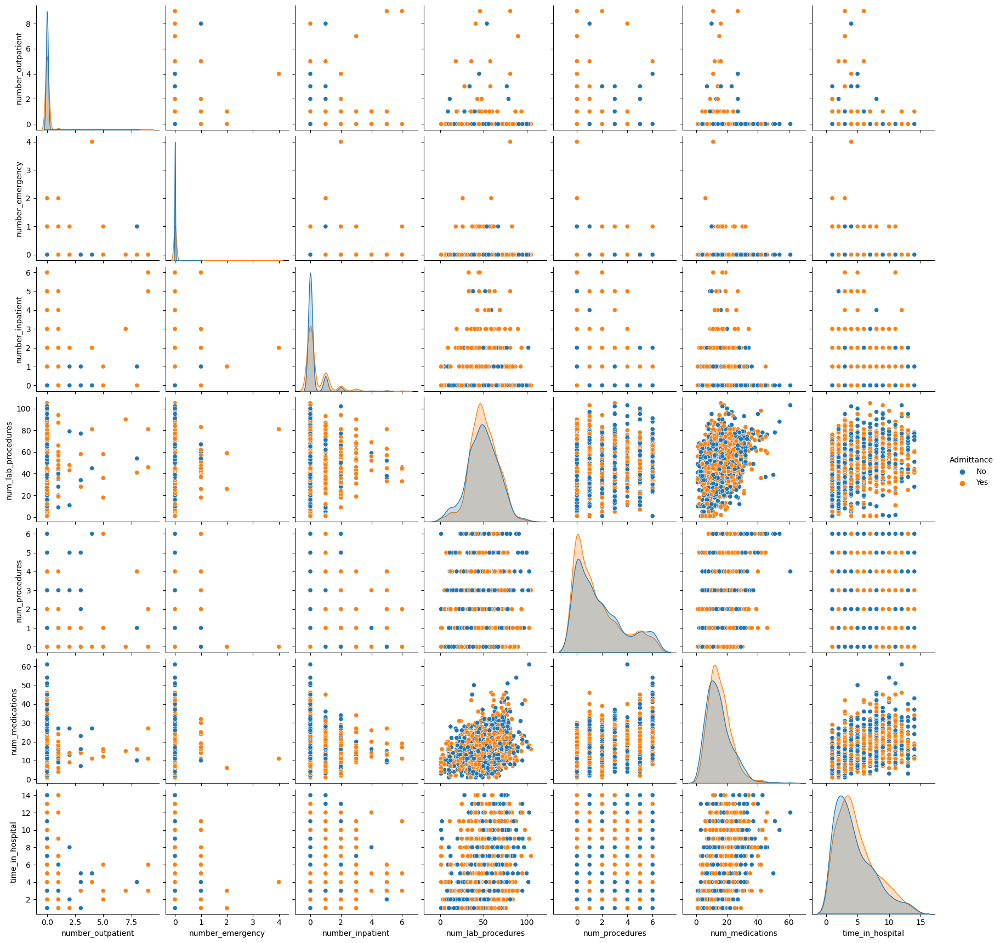

In [1320]:
import matplotlib.pyplot as plt
sns.pairplot(pairplot_data,hue='Admittance')


In [1493]:
from statsmodels.multivariate.manova import MANOVA

manova=MANOVA.from_formula('number_outpatient + number_emergency + number_inpatient ~age + readmitted',data)

print(manova.mv_test())

                    Multivariate linear model
                                                                  
------------------------------------------------------------------
         Intercept        Value  Num DF    Den DF   F Value Pr > F
------------------------------------------------------------------
            Wilks' lambda 0.9993 3.0000 101752.0000 25.0703 0.0000
           Pillai's trace 0.0007 3.0000 101752.0000 25.0703 0.0000
   Hotelling-Lawley trace 0.0007 3.0000 101752.0000 25.0703 0.0000
      Roy's greatest root 0.0007 3.0000 101752.0000 25.0703 0.0000
------------------------------------------------------------------
                                                                  
------------------------------------------------------------------
          age           Value   Num DF    Den DF   F Value  Pr > F
------------------------------------------------------------------
          Wilks' lambda 0.9819 27.0000 297168.9525  68.9400 0.0000
         Pillai'

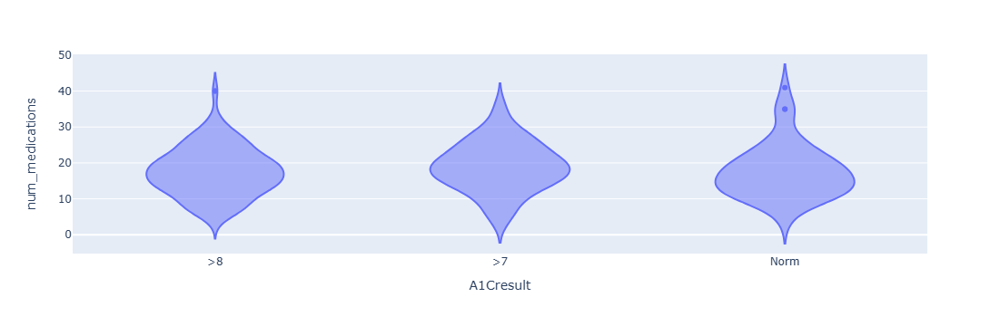

In [1527]:
fig=px.violin(readmission,x='A1Cresult',y='num_medications')
fig.show()

In [1322]:
data[['readmitted','A1Cresult']].value_counts()

readmitted  A1Cresult
NO          >8           4504
            Norm         2909
>30         >8           2901
NO          >7           2129
>30         Norm         1599
            >7           1300
<30         >8            811
            Norm          482
            >7            383
Name: count, dtype: int64

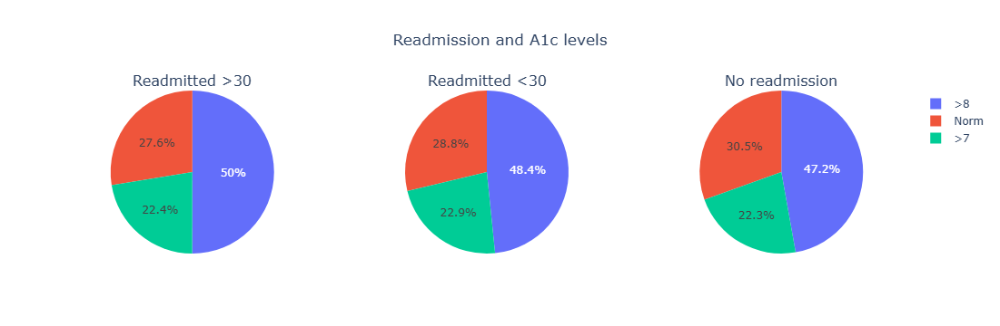

In [1549]:
info=data.groupby(['readmitted','A1Cresult'])['age'].count().reset_index()

readm30=info[info.readmitted =='>30']
readmu30=info[info.readmitted=='<30']
readmno=info[info.readmitted =='NO']


fig=make_subplots(rows=1,cols=3,specs=[[{"type": "domain"}, {"type": "domain"},{"type": "domain"}]],
                 subplot_titles=("Readmitted >30", "Readmitted <30", "No readmission"))

fig.add_trace(go.Pie(values=readm30.age,labels=readm30.A1Cresult),row=1,col=1)
fig.add_trace(go.Pie(values=readmu30.age,labels=readmu30.A1Cresult),row=1,col=2)
fig.add_trace(go.Pie(values=readmno.age,labels=readmno.A1Cresult),row=1,col=3)

fig.update_layout(title_text='Readmission and A1c levels',title_x=0.5)
fig.show()

In [1433]:
data.groupby('age')['num_medications'].mean()

age
[0-10)       6.180124
[10-20)      8.277858
[20-30)     11.972842
[30-40)     14.091656
[40-50)     15.391017
[50-60)     16.584492
[60-70)     17.150425
[70-80)     16.407818
[80-90)     15.326685
[90-100)    13.820265
Name: num_medications, dtype: float64

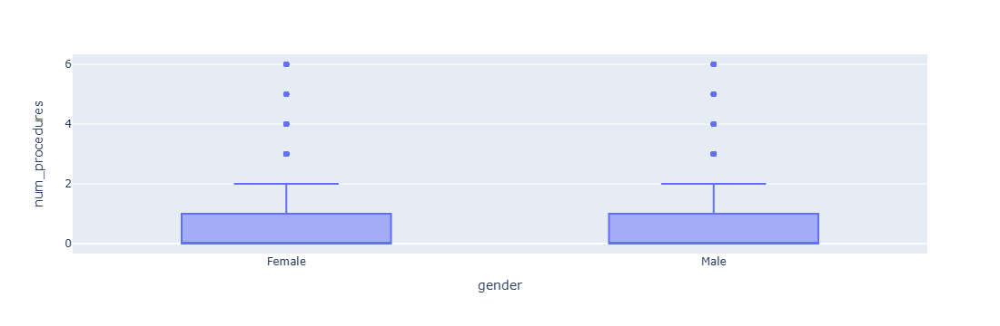

In [1389]:
fig=px.box(readmission,x='gender',y='num_procedures')
fig.show()

# Further Analysis

In [1059]:
readmitted_data=data[(data.readmitted != 'NO')]

In [1061]:
readmitted_data.groupby(['gender','age','race'])['readmitted'].count().nlargest(20).reset_index()

,gender,age,race,readmitted
0,Female,[70-80),Caucasian,5280
1,Male,[70-80),Caucasian,4857
2,Female,[80-90),Caucasian,4329
3,Male,[60-70),Caucasian,4025
4,Female,[60-70),Caucasian,3769
5,Male,[80-90),Caucasian,2809
6,Male,[50-60),Caucasian,2657
7,Female,[50-60),Caucasian,2646
8,Male,[40-50),Caucasian,1385
9,Female,[40-50),Caucasian,1365


In [760]:
readmitted_data[['gender','age','race']].value_counts().nlargest(20).reset_index()

,gender,age,race,count
0,Female,[70-80),Caucasian,5280
1,Male,[70-80),Caucasian,4857
2,Female,[80-90),Caucasian,4329
3,Male,[60-70),Caucasian,4025
4,Female,[60-70),Caucasian,3769
5,Male,[80-90),Caucasian,2809
6,Male,[50-60),Caucasian,2657
7,Female,[50-60),Caucasian,2646
8,Male,[40-50),Caucasian,1385
9,Female,[40-50),Caucasian,1365


In [1069]:
drugs=['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone']


In [1071]:
readmitted_data['metformin'].value_counts().to_dict()

{'No': 38257, 'Steady': 7951, 'Up': 435, 'Down': 259}

In [1073]:
drugs_adm={}
for col in drugs:
    results=data[data.readmitted =='NO']
    drugs_adm[col]=results[col].value_counts().to_dict()

In [1075]:
drugs_adm=pd.DataFrame(drugs_adm)
drugs_adm

,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,...,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone
No,43521,54170,54503,54817,52110,54864.0,48360,49064,54849.0,51067,...,54863.0,54838.0,54864.0,54864.0,26678,54494,54859.0,54864.0,54862.0,54863.0
Steady,10395,614,342,45,2465,NaN,5855,5058,15.0,3629,...,1.0,26.0,NaN,NaN,16934,358,5.0,NaN,2.0,1.0
Up,632,57,13,1,188,NaN,385,453,NaN,113,...,NaN,NaN,NaN,NaN,5484,7,NaN,NaN,NaN,NaN
Down,316,23,6,1,101,NaN,264,289,NaN,55,...,NaN,NaN,NaN,NaN,5768,5,NaN,NaN,NaN,NaN


In [1077]:
drugs_adm=drugs_adm.reset_index().rename(columns={'index':'levels'})

In [1079]:
drugs_adm

,levels,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,...,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone
0,No,43521,54170,54503,54817,52110,54864.0,48360,49064,54849.0,...,54863.0,54838.0,54864.0,54864.0,26678,54494,54859.0,54864.0,54862.0,54863.0
1,Steady,10395,614,342,45,2465,NaN,5855,5058,15.0,...,1.0,26.0,NaN,NaN,16934,358,5.0,NaN,2.0,1.0
2,Up,632,57,13,1,188,NaN,385,453,NaN,...,NaN,NaN,NaN,NaN,5484,7,NaN,NaN,NaN,NaN
3,Down,316,23,6,1,101,NaN,264,289,NaN,...,NaN,NaN,NaN,NaN,5768,5,NaN,NaN,NaN,NaN


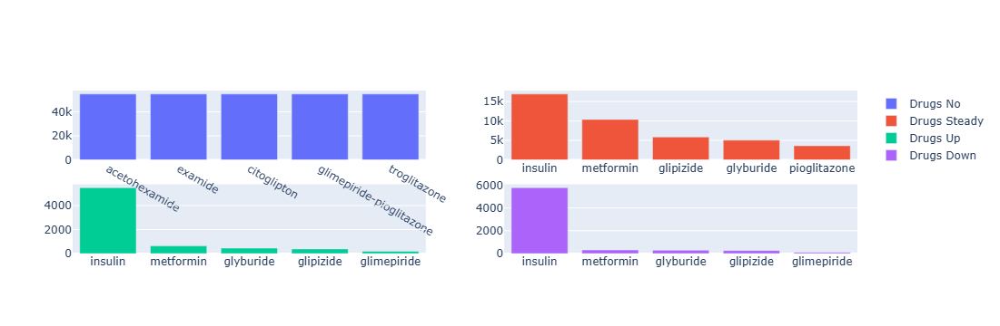

In [1085]:
fig=make_subplots(rows=2,cols=2)
r=1
c=1
for val in drugs_adm.levels.unique():

    info=drugs_adm[drugs_adm.levels==val]
    info=info[drugs].transpose().reset_index()
    info=info.nlargest(5,columns=info.columns[1])
    fig.add_trace(go.Bar(x=info[info.columns[0]],y=info[info.columns[1]],name=f'Drugs {val}' ),row=r,col=c)
    c+=1
    if c==3:
        r+=1
        c=1
    
fig.show(tight_layout=False)
    

In [550]:
up_drugs=drugs_adm[drugs_adm.levels=='Up']
up_drugs[drugs].transpose().reset_index().columns[1]

3

In [1041]:
data.time_in_hospital

0          1
1          3
2          2
3          2
4          1
          ..
101761     3
101762     5
101763     1
101764    10
101765     6
Name: time_in_hospital, Length: 101766, dtype: int64

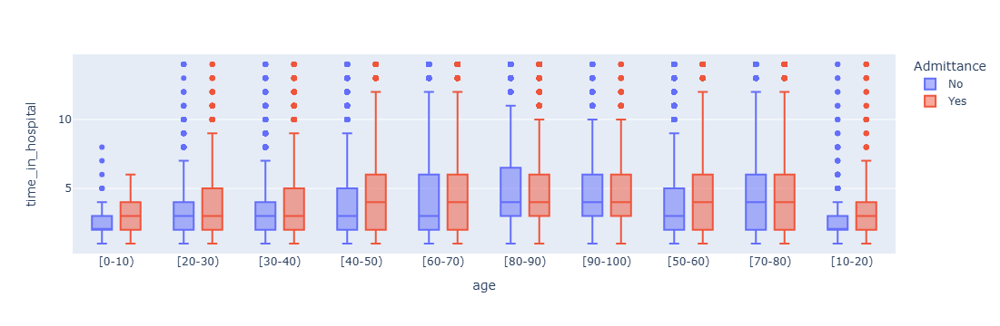

In [1087]:
fig=px.box(data,x='age',y='time_in_hospital',color='Admittance')
fig.show()

In [652]:
drogas=[]
for i in range(len(drugs)):
    q=data.groupby(['readmitted',drugs[i]])['age'].count().reset_index()
    q=q.rename(columns={'age':(drugs[i]+'_counts'),drugs[i]:'levels'})
    drogas.append(pd.DataFrame(q))

drugs_stats=drogas[0]

for df in drogas[1:]:
    drugs_stats=drugs_stats.merge(df,on=['readmitted','levels'],how='outer')


In [694]:
drugs_stats.columns

Index(['readmitted', 'levels', 'metformin_counts', 'repaglinide_counts',
       'nateglinide_counts', 'chlorpropamide_counts', 'glimepiride_counts',
       'acetohexamide_counts', 'glipizide_counts', 'glyburide_counts',
       'tolbutamide_counts', 'pioglitazone_counts', 'rosiglitazone_counts',
       'acarbose_counts', 'miglitol_counts', 'troglitazone_counts',
       'tolazamide_counts', 'examide_counts', 'citoglipton_counts',
       'insulin_counts', 'glyburide-metformin_counts',
       'glipizide-metformin_counts', 'glimepiride-pioglitazone_counts',
       'metformin-rosiglitazone_counts', 'metformin-pioglitazone_counts'],
      dtype='object')

In [666]:
up_readmitted=drugs_stats[(drugs_stats.readmitted!= 'NO')]
up_readmitted

#fig=px.bar(up_readmitted,x=[[(x+'_counts') for x in drugs]],

,readmitted,levels,metformin_counts,repaglinide_counts,nateglinide_counts,chlorpropamide_counts,glimepiride_counts,acetohexamide_counts,glipizide_counts,glyburide_counts,...,troglitazone_counts,tolazamide_counts,examide_counts,citoglipton_counts,insulin_counts,glyburide-metformin_counts,glipizide-metformin_counts,glimepiride-pioglitazone_counts,metformin-rosiglitazone_counts,metformin-pioglitazone_counts
0,<30,Down,69,3,1,NaN,25,NaN,85,52,...,NaN,NaN,NaN,NaN,1698,1.0,NaN,NaN,NaN,NaN
1,<30,No,9418,11152,11277,11352.0,10827,11357.0,9905,10225,...,11357.0,11354.0,11357.0,11357.0,4756,11279.0,11356.0,11357.0,11357.0,11357.0
2,<30,Steady,1782,182,78,5.0,468,NaN,1268,995,...,NaN,3.0,NaN,NaN,3433,77.0,1.0,NaN,NaN,NaN
3,<30,Up,88,20,1,NaN,37,NaN,99,85,...,NaN,NaN,NaN,NaN,1470,NaN,NaN,NaN,NaN,NaN
4,>30,Down,190,19,4,NaN,68,NaN,211,223,...,NaN,NaN,NaN,NaN,4752,NaN,NaN,NaN,NaN,NaN
5,>30,No,28839,34905,35283,35511.0,33638,35544.0,30815,31827,...,35543.0,35535.0,35545.0,35545.0,15949,35287.0,35538.0,35544.0,35545.0,35545.0
6,>30,Steady,6169,588,248,29.0,1737,1.0,4233,3221,...,2.0,9.0,NaN,NaN,10482,257.0,7.0,1.0,NaN,NaN
7,>30,Up,347,33,10,5.0,102,NaN,286,274,...,NaN,1.0,NaN,NaN,4362,1.0,NaN,NaN,NaN,NaN


In [736]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import dash
from dash import Dash, dcc, html, Input, Output,callback

app=Dash()
options=[x for x in drugs_stats.columns if 'counts' in x]
app.layout=html.Div([
    dcc.Dropdown(options,options[0],id='selected_drug',style={'width':'400px'}),
    dcc.Graph(id='drug_bar')
])

@app.callback(
    Output('drug_bar','figure'),
    Input('selected_drug','value')
)
def update_graph(selected_drug):
    df=drugs_stats[['readmitted','levels',selected_drug]]
    fig=px.bar(df,x='readmitted',y=selected_drug,color='levels',barmode='group')
    fig.update_yaxes(title_text='Counts for drug')
    return fig

app.run_server(jupyter_mode="inline",port=8051,debug=True)

NameError: name 'drugs_stats' is not defined

In [714]:
data.groupby(['readmitted','gender','age'])['metformin'].count()

readmitted  gender           age     
<30         Female           [0-10)         1
                             [10-20)       24
                             [20-30)      177
                             [30-40)      242
                             [40-50)      511
                                         ... 
NO          Male             [70-80)     6280
                             [80-90)     3518
                             [90-100)     495
            Unknown/Invalid  [60-70)        1
                             [70-80)        2
Name: metformin, Length: 62, dtype: int64

In [1327]:
non_readmission_data=data[data.readmitted== 'NO']
non_combo=list(zip(non_readmission_data[drugs].values))
non_combo=np.ravel(non_combo).tolist()


In [898]:
non_combo=[x for x in non_combo if x!='No']
print('Non-readmission drugs split:')
for i in set(non_combo):
    print( i, (non_combo.count(i)/len(non_combo)*100))

Non-readmission drugs split:
Steady 77.36832133383858
Down 10.876910445875962
Up 11.754768220285463


In [1117]:
readmission_data=data[data.readmitted != 'NO']
combo=list(zip(readmission_data[drugs].values))
combo=np.ravel(combo).tolist()

In [1119]:
combo=[x for x in combo if x!='No']
print('Readmission drugs split:')
for i in set(combo):
    print( i, (combo.count(i)/len(combo)*100))

Readmission drugs split:
Down 13.21978913219789
Steady 73.69794421524031
Up 13.082266652561797


In [1123]:
readm_patients=readmission_data.groupby('patient_nbr')['readmitted'].count().nlargest(200).reset_index()

In [1125]:
readmission=readmission_data[readmission_data.patient_nbr.isin(readm_patients.patient_nbr)]
combo=list(zip(readmission[drugs].values))
combo=np.ravel(combo).tolist()
combo=[x for x in combo if x!='No']
print('Readmission drugs split:')
for i in set(combo):
    print( i, (combo.count(i)/len(combo)*100))

Readmission drugs split:
Down 20.098224404986777
Steady 61.23913864752551
Up 18.66263694748772


In [1129]:
readmission.groupby('age')['admission_source_descr'].value_counts()

age       admission_source_descr                                    
[10-20)    Emergency Room                                                12
           Physician Referral                                            10
          Transfer from a hospital                                        2
[20-30)    Emergency Room                                               152
           Transfer from another health care facility                    10
           Physician Referral                                             5
          Transfer from a hospital                                        3
[30-40)    Emergency Room                                               135
           Physician Referral                                            23
           Transfer from another health care facility                     1
          Clinic Referral                                                 1
[40-50)    Emergency Room                                               339
           Physicia

In [1135]:
readmission.groupby('age')['discharge_disposition_descr'].value_counts()

age       discharge_disposition_descr                            
[10-20)   Discharged to home                                          22
          Not Mapped                                                   2
[20-30)   Discharged to home                                         163
          Left AMA                                                    10
          Discharged/transferred to home with home health service      9
                                                                    ... 
[80-90)   Discharged/transferred to a long term care hospital.         1
[90-100)  Discharged to home                                          30
          Discharged/transferred to home with home health service      8
          Discharged/transferred to SNF                                3
          Not Mapped                                                   1
Name: count, Length: 73, dtype: int64

In [1375]:
readmission_data.groupby('age')[['num_lab_procedures', 'num_procedures', 'num_medications']].agg(['min','mean','max','std'])

num_lab_procedures                            num_procedures  \
                        min       mean  max        std            min   
age                                                                     
[0-10)                    1  44.689655   80  17.042182              0   
[10-20)                   1  47.689394   88  19.039336              0   
[20-30)                   1  44.927614  132  20.014293              0   
[30-40)                   1  45.227809  105  20.404320              0   
[40-50)                   1  44.165389  102  19.899575              0   
[50-60)                   1  44.035860  105  19.230579              0   
[60-70)                   1  43.538706  113  19.461218              0   
[70-80)                   1  43.913026  109  19.442313              0   
[80-90)                   1  43.788218  129  19.481872              0   
[90-100)                  1  43.782648   94  19.158814              0   

                                 num_medications                           
              mean max       std             min       mean max       std  
age                                                                        
[0-10)    0.206897   3  0.619868               1   6.724138  17  3.315511  
[10-20)   0.257576   6  0.781158               1   9.049242  34  5.446721  
[20-30)   0.577748   6  1.054228               1  12.250670  39  6.724704  
[30-40)   1.022967   6  1.451525               1  14.816263  63  7.691393  
[40-50)   1.252962   6  1.651259               1  16.316609  68  7.753484  
[50-60)   1.468688   6  1.779988               1  17.423731  70  8.257446  
[60-70)   1.454948   6  1.760759               1  17.472545  81  8.127352  
[70-80)   1.299107   6  1.691926               1  16.512516  72  7.566211  
[80-90)   0.981087   6  1.444809               1  15.478738  61  6.800633  
[90-100)  0.632379   6  1.072947               1  13.798748  35  6.043984

In [1113]:
new_app=Dash()
o=['number_outpatient', 'number_emergency', 'number_inpatient','num_lab_procedures', 'num_procedures', 'num_medications','time_in_hospital']
new_app.layout=html.Div([
    html.Div([
        dcc.Dropdown(options=data.Admittance.unique(),value='No',id='admit_option',placeholder='Select admit value'),
        dcc.Dropdown(options=o,value='num_procedures',id='num_option',placeholder='Select option'),
        dcc.Graph(id='violin_plot')])
])

@new_app.callback(
    Output('violin_plot','figure'),
    Input('admit_option','value'),
    Input('num_option','value')
)

def update_violin(admit_option,num_option):
    info=data[data.Admittance == admit_option]
    #info['normalized']=info.groupby('age')[num_option]#.transform(lambda x: (x-x.min()/(x.min()+x.max())))
    fig=px.violin(info,x='age',y=num_option,color='age')
    option=' '.join(num_option.split('_')).capitalize()
    fig.update_yaxes(title_text=f'{option} Normalized Values')
    fig.update_layout(title_text=f'{admit_option} Admittance vs {option}')
    return fig
new_app.run_server(jupyter_mode="inline",port=8051,debug=True)
